# A. Exploring the Data

## 1. Obtain


In [2]:
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
%matplotlib inline

import scipy.stats as stats
import sklearn.linear_model as linear_model

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

import seaborn as sns
sns.set_palette('PuBu_r')
sns.set_style('darkgrid')

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3267, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-2-0a65979d2f8f>", line 8, in <module>
    import sklearn.linear_model as linear_model
  File "/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/__init__.py", line 12, in <module>
    from .base import LinearRegression
  File "/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/base.py", line 38, in <module>
    from ..preprocessing.data import normalize as f_normalize
  File "/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/__init__.py", line 6, in <module>
    from ._function_transformer import FunctionTransformer
  File "/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_function_transformer.py", line 5, in <module>
    from ..utils.testing import assert_allclose_dense_sparse
  File "/anaconda3/lib/python3.7/site-packages/sklearn/

TypeError: attr() got an unexpected keyword argument 'type'

In [ ]:
df = pd.read_csv('kc_housing_data_for_feat_engineering_lab.csv')

df.head()

Here we see some summary statistics for our dataframe.

In [ ]:
df.describe()

At a birds'-eye view, we can see that the dataset contains 21,597 entries, each representing a home. Each home is associated with 21 factors or variables (expressed below as columns).

In [ ]:
# look at Sean's stuff
new = pd.DataFrame([df['price_log'], df['year_sold'], df['yr_old']])
new.T.head()

In [6]:
df.drop('year_sold', axis=1, inplace=True)

## 3. Feature Engineering

##### __Requirements__

+ 4 new features: 2 not polynomial or interaction; 1 interaction
+ baseline model with ALL new features
+ perform feature selection
+ explain thought process in md cells
+ comment code
+ run at least 3 models inc. ridge, lasso, or other (r/hl with diff alpha, eg)
+ after TTS, report final RMSE on test set with explanation of best fit model

### New features:

+ Years old 
+ Year sold 
+ Month sold
+ Square feet per floor of house (log)
+ West from downtown * waterfront (interaction)
+ Interaction term with sqft_living15, grade, condition
+ Interaction 'waterfront * 'lat' * 'sqft_living'
+ Bathrooms * sqft_living
+ Proximity to downtown


#### Transforms:

+ Dummied zip
+ Will dummy grade, floors, etc. using "C" in the OLS function

In [7]:
# Create column for years old
df['yrs_old'] = 2019-df['yr_built']

In [8]:
# Create date object from date column for further manipulation
df['date'] = pd.to_datetime(df['date'])

In [9]:
# Create features for year and month sold
df['yr_sold'] = df['date'].map(lambda x: x.year)
df['month_sold'] = df['date'].map(lambda x: x.month)

In [10]:
# Square feet per floor of house
df['sqft_living_per_floor_log'] = np.log(df['sqft_living']/df['floors'])

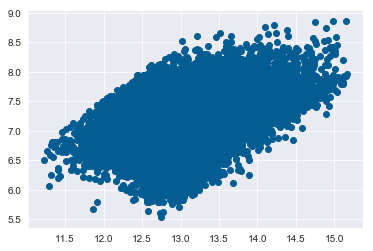

In [11]:
# look at scatter of the distribution
plt.scatter(df['price_log'], df['sqft_living_per_floor_log'])

In [12]:
downtown_df = pd.DataFrame([[47.606850, -122.332512],], columns=['lat', 'long'])
downtown_df

,lat,long
0,47.60685,-122.332512


In [13]:
def lat_long_dist(col1, col2):
    return (111*(col2[0]-col1[0])**2 + 75*(col2[1]-col1[1])**2)**(0.5)

downtown = (47.606850, -122.332512)

lat_long = zip(df['lat'], df['long'])
df['prox_to_downtown'] = list(map(lambda x: lat_long_dist(x,downtown), lat_long))

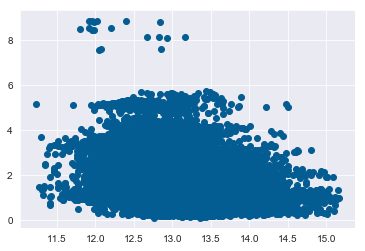

In [14]:
plt.scatter(df['price_log'], df['prox_to_downtown'])

In [15]:
# Interaction term: neg and pos from downtown plus waterfront
df['west_from_downtown'] = (df['lat']-downtown_df['lat'][0])*df['waterfront']

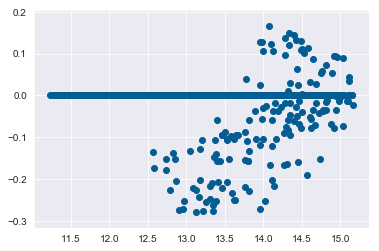

In [16]:
plt.scatter(df['price_log'], df['west_from_downtown'])

In [17]:
# get zipcode dummies
zip_dummies = pd.get_dummies(df['zipcode'], prefix='zip', drop_first=True)

In [18]:
df = pd.concat([df, zip_dummies], axis=1)
df.drop('zipcode', axis=1, inplace=True)

In [19]:
# Square feet of bathrooms * sqftliving15
df['bathrooms_times_sqftliving15'] = (df['bathrooms'] * df['sqft_living15'])**0.25

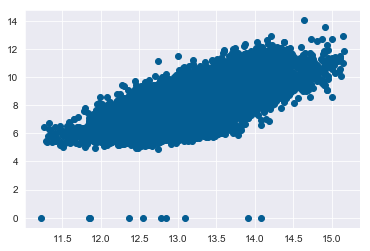

In [20]:
plt.scatter(df['price_log'], df['bathrooms_times_sqftliving15'])

In [21]:
# Interaction term with sqft_living15, grade, condition
df['sqlv_grade_cond_interaction'] = np.log(df['sqft_living15'] * df['grade'] * df['condition'])

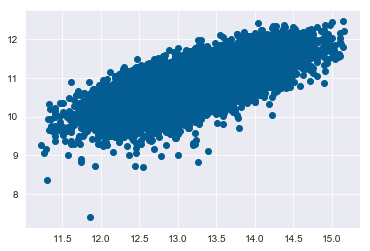

In [22]:
plt.scatter(df['price_log'], df['sqlv_grade_cond_interaction'])

In [94]:
#import numpy as np 
#import pylab 
#import scipy.stats as stats
#
#new_df = df[df['waterfront_living_lat'] != 0]
#new_list = new_df['waterfront_living_lat']
#measurements = new_list
#stats.probplot(measurements, dist="norm", plot=pylab)
#pylab.show()

In [95]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,bathrooms_times_sqftliving15,sqlv_grade_cond_interaction
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,0,0,0,0,1,0,0,0,6.050290,10.244947
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,0,0,0,0,0,0,0,0,7.852669,10.477006
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,0,0,0,0,0,0,0,0,7.221746,10.798759
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,0,0,0,0,0,0,0,0,7.992176,10.770588
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,0,0,0,0,0,0,0,0,7.745967,10.673596


## 4. Feature Filtering and Selection

+ Split data into training and testing and fit the scaler to it
+ Visualize features and check for collinearity (drop those)
+ Select out features to drop using F-test (but don't drop them yet!)

In [96]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat',
       'long', 'sqft_living15', 'sqft_lot15', 'yr_old', 'since_sold',
       'price_log', 'yrs_old', 'yr_sold', 'month_sold',
       'sqft_living_per_floor_log', 'prox_to_downtown', 'west_from_downtown',
       'zip_98002', 'zip_98003', 'zip_98004', 'zip_98005', 'zip_98006',
       'zip_98007', 'zip_98008', 'zip_98010', 'zip_98011', 'zip_98014',
       'zip_98019', 'zip_98022', 'zip_98023', 'zip_98024', 'zip_98027',
       'zip_98028', 'zip_98029', 'zip_98030', 'zip_98031', 'zip_98032',
       'zip_98033', 'zip_98034', 'zip_98038', 'zip_98039', 'zip_98040',
       'zip_98042', 'zip_98045', 'zip_98052', 'zip_98053', 'zip_98055',
       'zip_98056', 'zip_98058', 'zip_98059', 'zip_98065', 'zip_98070',
       'zip_98072', 'zip_98074', 'zip_98075', 'zip_98077', 'zip_98092',
    

In [23]:
cols = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition',
       'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat',
       'long', 'sqft_living15', 'sqft_lot15', 'yr_old', 'since_sold',
       'price_log', 'yrs_old', 'yr_sold', 'month_sold',
       'sqft_living_per_floor_log', 'prox_to_downtown', 'west_from_downtown',
        'bathrooms_times_sqftliving15', 'sqlv_grade_cond_interaction']

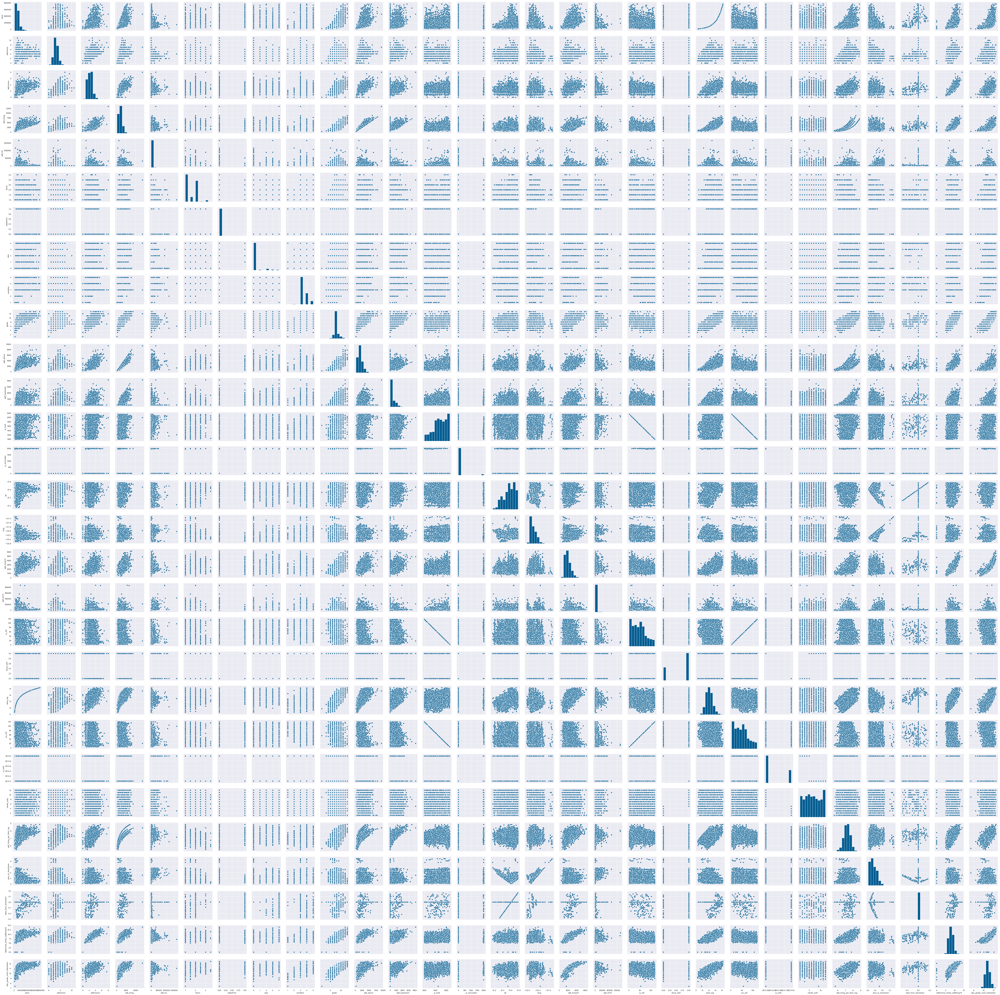

In [98]:
sns.pairplot(df, vars=cols)

In [24]:
# Set up TTS
target = df['price_log']
features = df[df.columns]

In [25]:
# drop price columns from features
features.drop(['price','price_log'], axis=1, inplace=True)

In [26]:
features.drop('date', axis=1, inplace=True)

In [27]:
feature_columns = []
for col in features.columns:
    feature_columns.append(col)

In [28]:
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=34,test_size=0.2)

In [29]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train =pd.DataFrame(data=scaler.transform(X_train), columns=feature_columns)
X_test =pd.DataFrame(data=scaler.transform(X_test), columns=feature_columns)

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.


In [30]:
# Create correlation matrix
corr_matrix = X_train.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,bathrooms_times_sqftliving15,sqlv_grade_cond_interaction
id,NaN,0.005313,0.004285,0.013520,0.129386,0.019743,0.005859,0.015448,0.021347,0.010378,...,0.010223,0.024607,0.054600,0.020186,0.009359,0.006366,0.026741,0.045030,0.004427,0.006399
bedrooms,NaN,NaN,0.530020,0.592702,0.036030,0.183029,0.010245,0.085818,0.023423,0.365484,...,0.004863,0.005410,0.044227,0.001240,0.009632,0.006236,0.025186,0.023826,0.535646,0.426596
bathrooms,NaN,NaN,NaN,0.752420,0.089223,0.507841,0.052506,0.186547,0.126874,0.662341,...,0.051445,0.028124,0.099837,0.001960,0.055967,0.023038,0.054110,0.009951,0.889415,0.570908
sqft_living,NaN,NaN,NaN,NaN,0.178578,0.361502,0.092429,0.284952,0.061098,0.762556,...,0.043792,0.003787,0.073513,0.032100,0.043372,0.021455,0.045438,0.006437,0.827432,0.740104
sqft_lot,NaN,NaN,NaN,NaN,NaN,0.001608,0.023191,0.073394,0.009503,0.114325,...,0.016497,0.003920,0.010458,0.006352,0.017166,0.009788,0.013692,0.028083,0.124286,0.132716
floors,NaN,NaN,NaN,NaN,NaN,NaN,0.025368,0.028801,0.269161,0.461378,...,0.074103,0.048739,0.075559,0.047873,0.062035,0.040210,0.058995,0.003994,0.445141,0.244631
waterfront,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.400990,0.022451,0.077167,...,0.006289,0.064981,0.009948,0.003101,0.033815,0.006834,0.035940,0.010675,0.069583,0.083161
view,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047482,0.249859,...,0.011279,0.067389,0.031960,0.088981,0.042524,0.009222,0.052564,0.043788,0.243973,0.282209
condition,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144915,...,0.011765,0.029431,0.026246,0.016470,0.017128,0.006097,0.006469,0.014879,0.118019,0.278800
grade,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.060813,0.019940,0.110469,0.033099,0.077164,0.038709,0.056647,0.032354,0.759129,0.758076


In [123]:
# Fit the scaler to the training data 
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(data=scaler.transform(X_train), columns=features)
xX_test = pd.DataFrame(data=scaler.transform(X_test), columns=features)

/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.


ValueError: Shape of passed values is (97, 17280), indices imply (21600, 17280)

In [36]:
# Check for highly collinear terms

pd.set_option('display.max_columns', 500)
cocorr = upper[(upper > 0.95).any(1)]
cocorr

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,yr_old,since_sold,yrs_old,yr_sold,month_sold,sqft_living_per_floor_log,prox_to_downtown,west_from_downtown,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,bathrooms_times_sqftliving15,sqlv_grade_cond_interaction
yr_built,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.227694,0.149889,0.406562,0.324585,0.070829,1.0,0.000182,1.000000,0.000182,0.000758,0.048663,0.408709,0.034156,0.013351,0.021320,0.006295,0.003615,0.039816,0.001549,0.020114,0.025601,0.036276,0.019373,0.064968,0.003604,0.039300,0.002796,0.075734,0.028506,0.112705,0.053883,0.038205,0.014580,0.035551,0.026789,0.140955,0.002411,0.001798,0.085126,0.052909,0.076414,0.127270,0.001809,0.029887,0.037079,0.088038,0.107068,0.009156,0.037974,0.090764,0.098865,0.046476,0.082396,0.046168,0.103870,0.104190,0.021856,0.034575,0.042399,0.072798,0.100891,0.129847,0.067420,0.127467,0.109119,0.070628,0.087561,0.050972,0.074921,0.039465,0.055727,0.067456,0.062776,0.011021,0.049283,0.049723,0.070946,0.040244,0.058665,0.013787,0.020018,0.055498,0.485739,0.248612
yr_old,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000182,1.000000,0.000182,0.000758,0.048663,0.408709,0.034156,0.013351,0.021320,0.006295,0.003615,0.039816,0.001549,0.020114,0.025601,0.036276,0.019373,0.064968,0.003604,0.039300,0.002796,0.075734,0.028506,0.112705,0.053883,0.038205,0.014580,0.035551,0.026789,0.140955,0.002411,0.001798,0.085126,0.052909,0.076414,0.127270,0.001809,0.029887,0.037079,0.088038,0.107068,0.009156,0.037974,0.090764,0.098865,0.046476,0.082396,0.046168,0.103870,0.104190,0.021856,0.034575,0.042399,0.072798,0.100891,0.129847,0.067420,0.127467,0.109119,0.070628,0.087561,0.050972,0.074921,0.039465,0.055727,0.067456,0.062776,0.011021,0.049283,0.049723,0.070946,0.040244,0.058665,0.013787,0.020018,0.055498,0.485739,0.248612
since_sold,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000182,1.000000,0.783013,0.008963,0.010124,0.005258,0.002982,0.004734,0.003020,0.002392,0.011241,0.008769,0.000361,0.006393,0.013419,0.007666,0.004295,0.006703,0.003406,0.013912,0.004898,0.004366,0.011272,0.019503,0.001963,0.003644,0.000508,0.004350,0.005983,0.007517,0.004066,0.017815,0.016883,0.012722,0.003995,0.011019,0.008516,0.009226,0.003869,0.005096,0.019920,0.004346,0.015756,0.003626,0.005947,0.009341,0.005569,0.014786,0.003372,0.010117,0.010047,0.012602,0.008713,0.008838,0.000633,0.004443,0.014610,0.023240,0.003136,0.006560,0.007455,0.011413,0.007262,0.005093,0.009732,0.022769,0.000427,0.004106,0.002025,0.003720,0.013553,0.001796,0.008102,0.005808,0.000992,0.030378,0.041786


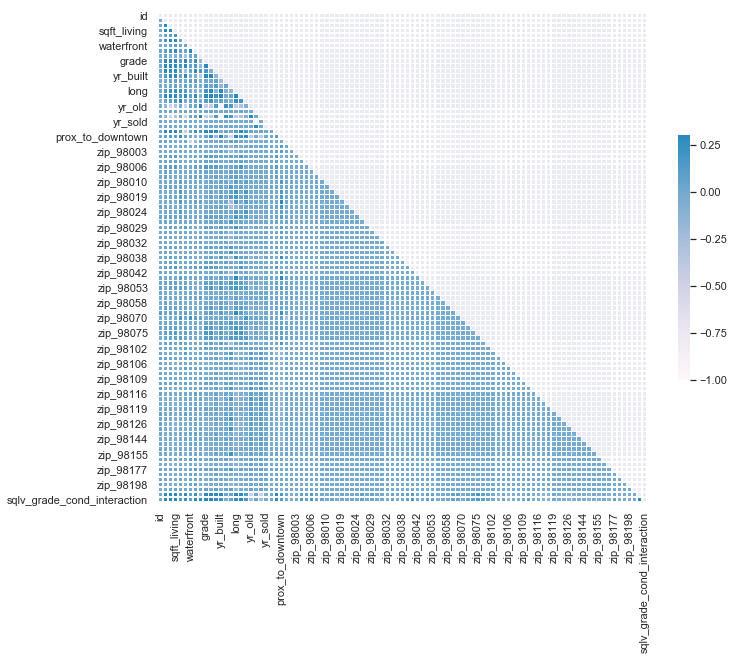

In [31]:
sns.set(style="darkgrid")

# Compute the correlation matrix
corr = X_train.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
#cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap='PuBu', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [37]:
len(X_train.columns)

97

In [39]:
# Find index of feature columns with correlation greater than 0.95
# This comports with the strategy above

to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
to_drop

['yr_old', 'yrs_old', 'yr_sold']

In [41]:
X_train.drop(columns=to_drop, inplace=True)
X_test.drop(columns=to_drop, inplace=True)

In [42]:
len(X_train.columns)

94

id


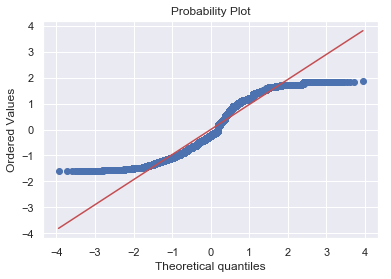

bedrooms


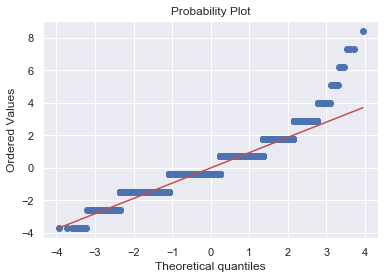

bathrooms


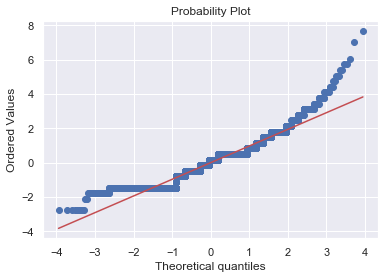

sqft_living


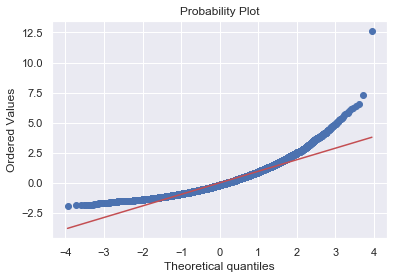

sqft_lot


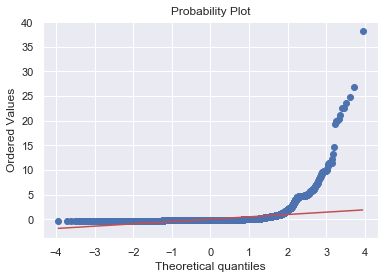

floors


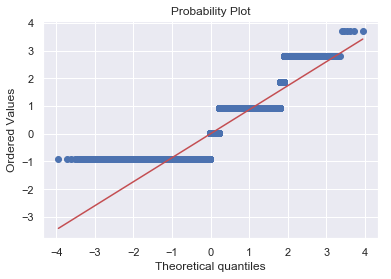

waterfront


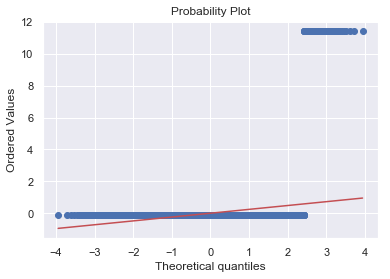

view


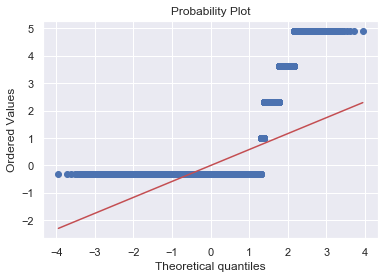

condition


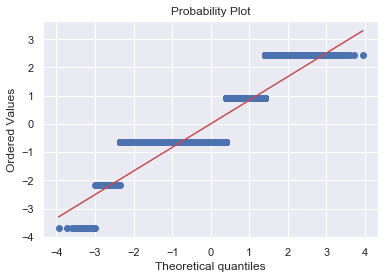

grade


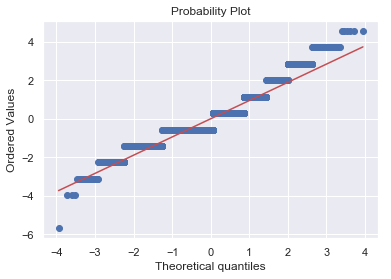

sqft_above


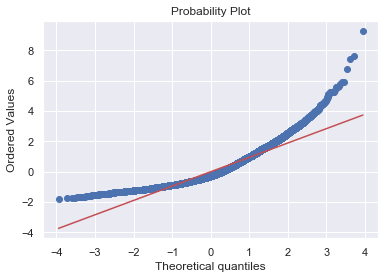

sqft_basement


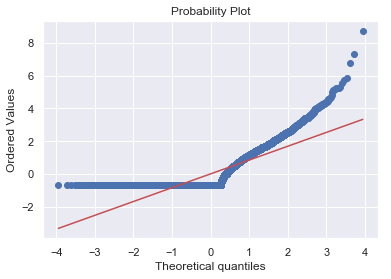

yr_built


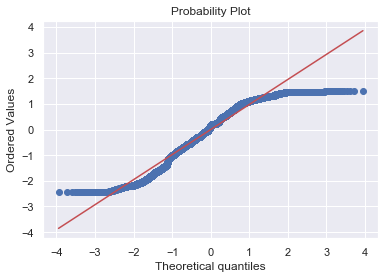

yr_renovated


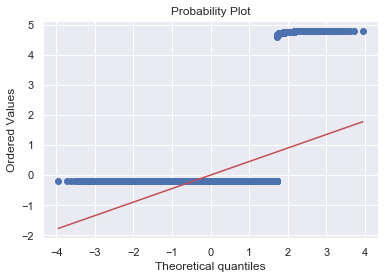

lat


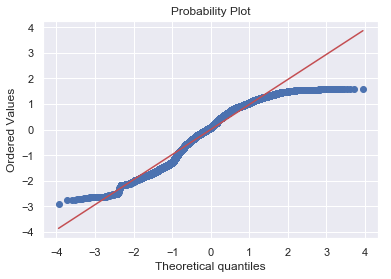

long


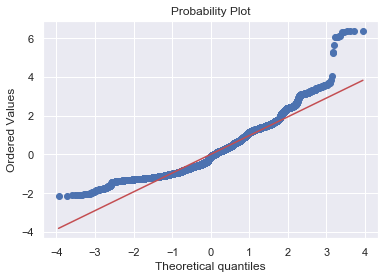

sqft_living15


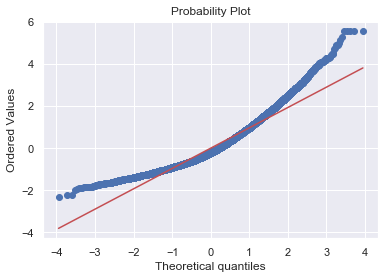

sqft_lot15


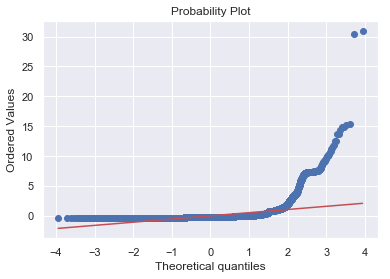

since_sold


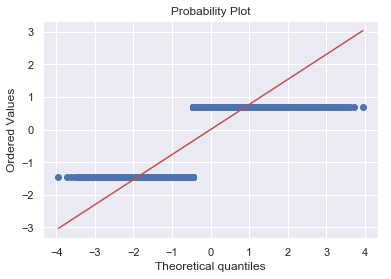

month_sold


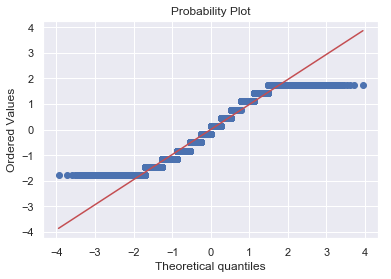

sqft_living_per_floor_log


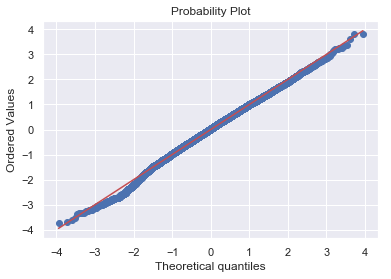

prox_to_downtown


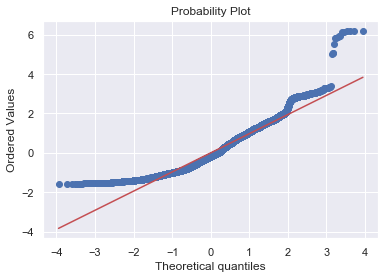

west_from_downtown


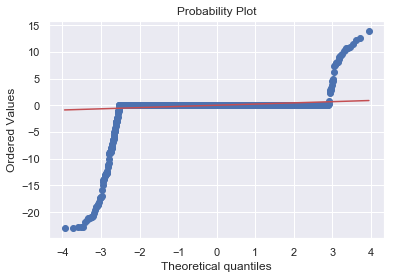

zip_98002


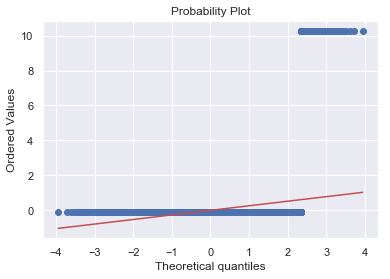

zip_98003


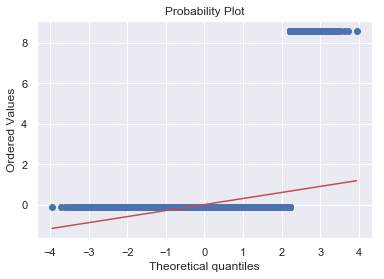

zip_98004


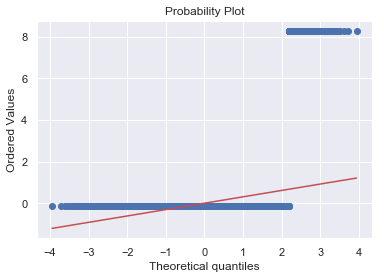

zip_98005


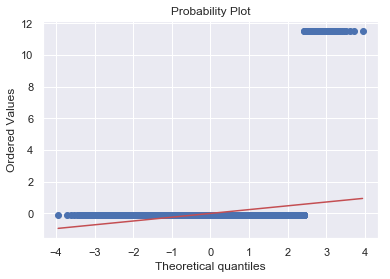

zip_98006


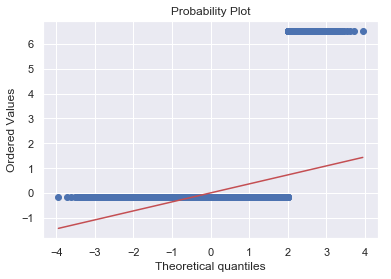

zip_98007


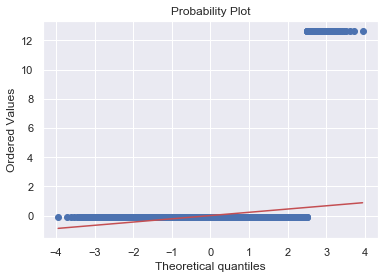

zip_98008


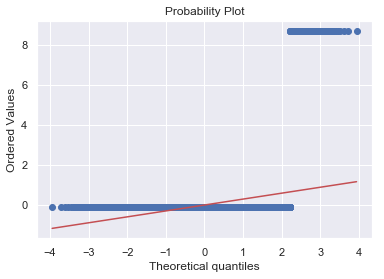

zip_98010


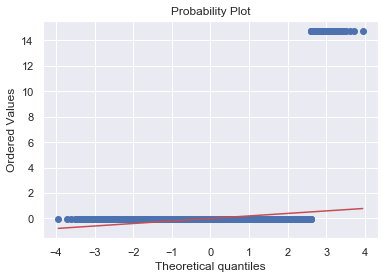

zip_98011


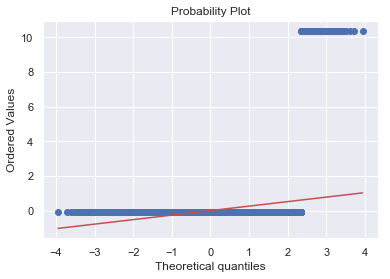

zip_98014


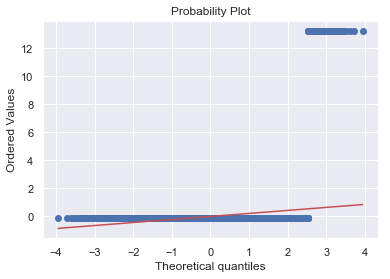

zip_98019


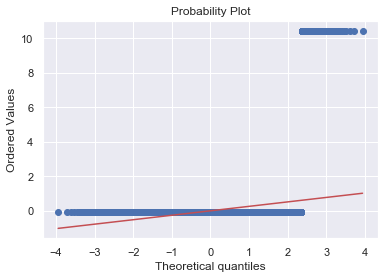

zip_98022


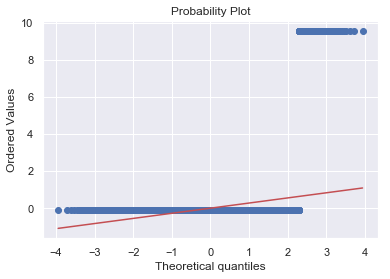

zip_98023


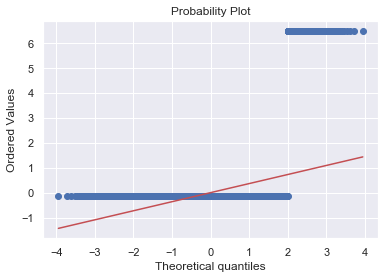

zip_98024


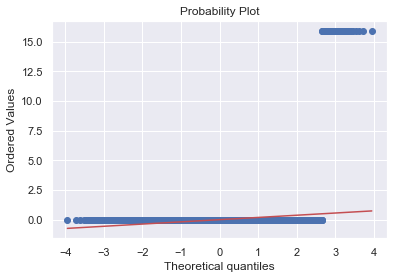

zip_98027


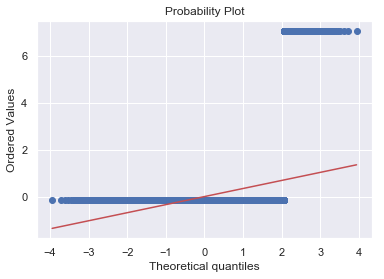

zip_98028


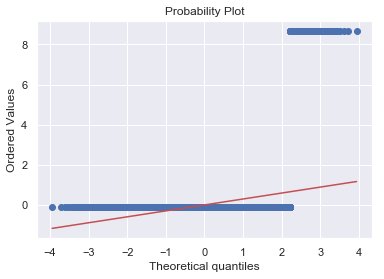

zip_98029


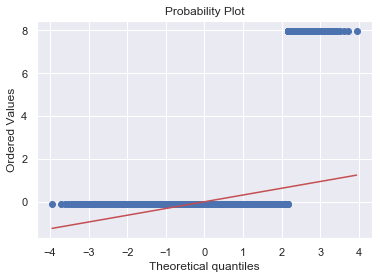

zip_98030


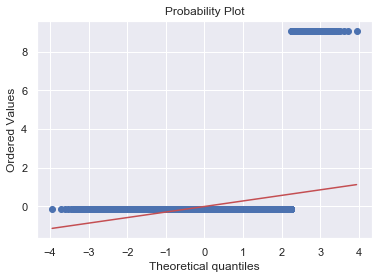

zip_98031


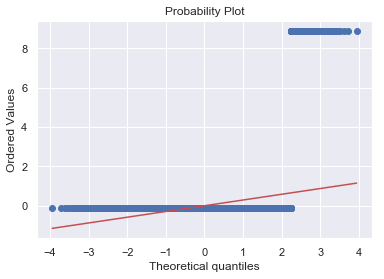

zip_98032


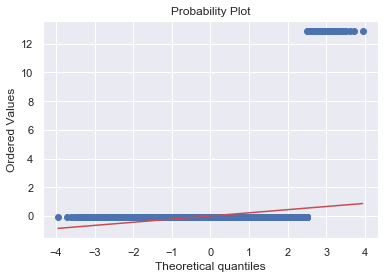

zip_98033


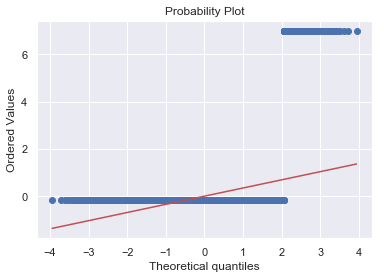

zip_98034


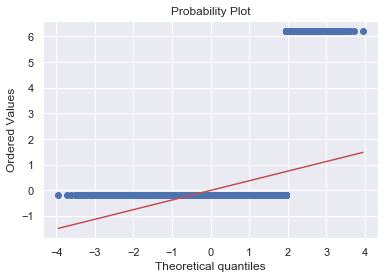

zip_98038


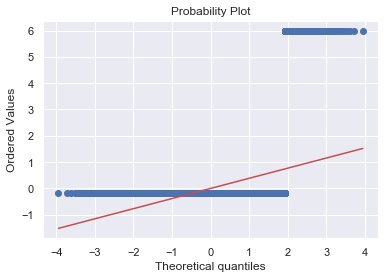

zip_98039


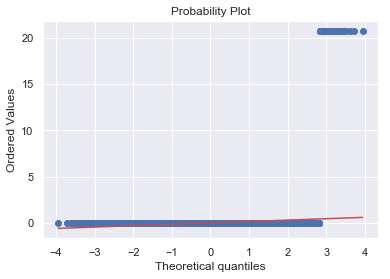

zip_98040


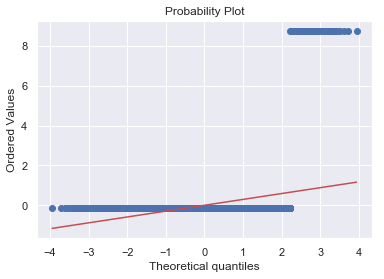

zip_98042


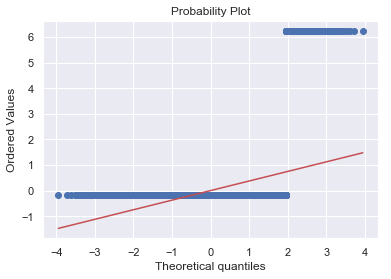

zip_98045


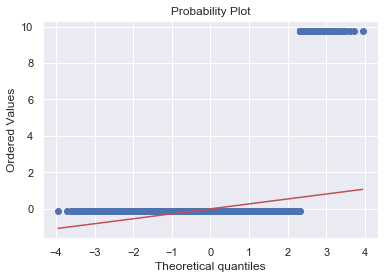

zip_98052


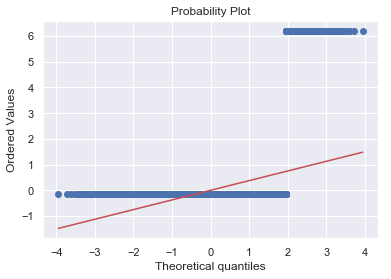

zip_98053


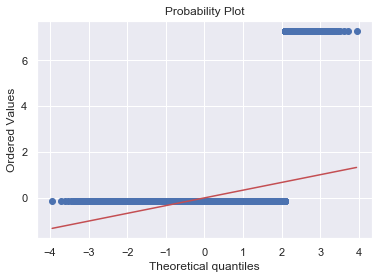

zip_98055


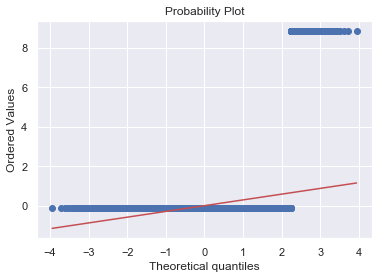

zip_98056


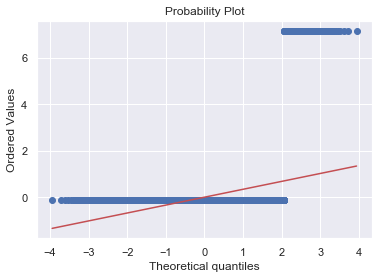

zip_98058


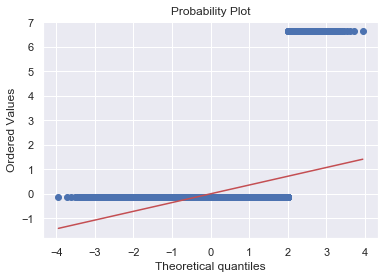

zip_98059


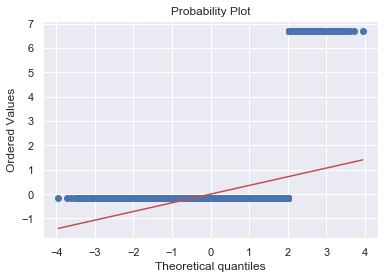

zip_98065


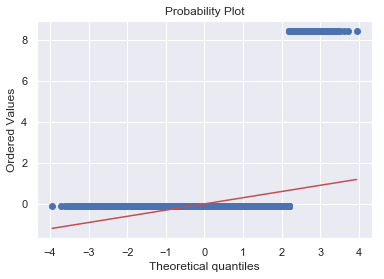

zip_98070


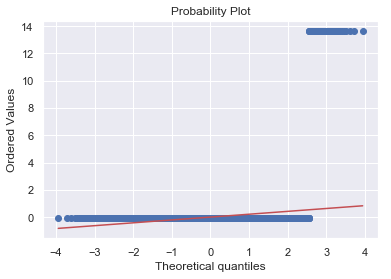

zip_98072


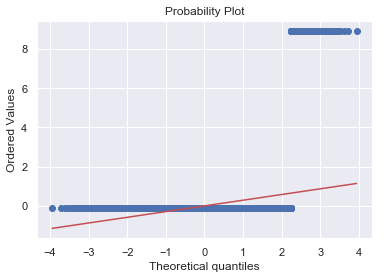

zip_98074


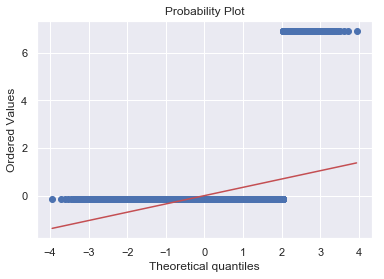

zip_98075


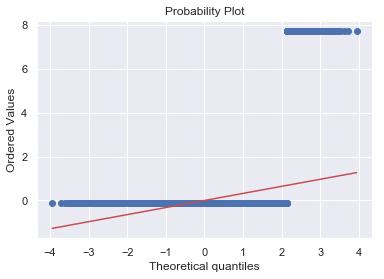

zip_98077


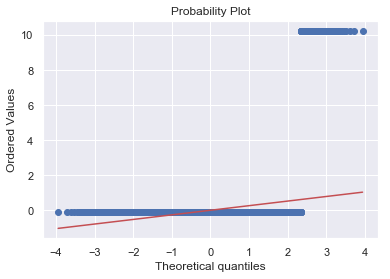

zip_98092


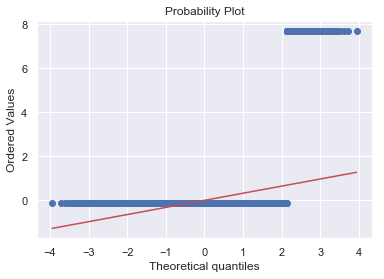

zip_98102


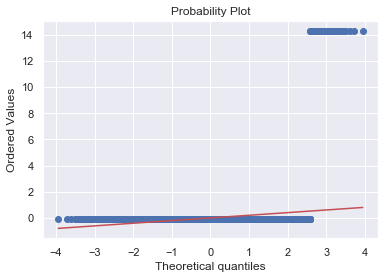

zip_98103


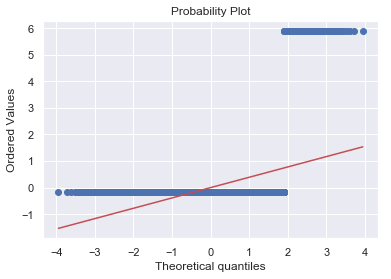

zip_98105


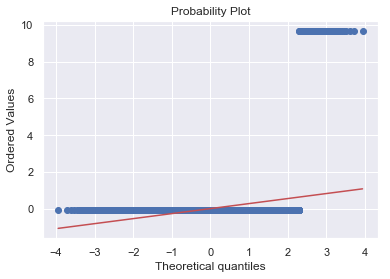

zip_98106


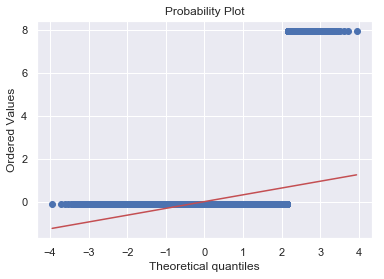

zip_98107


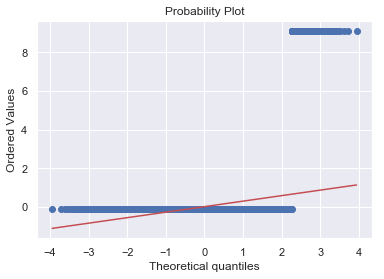

zip_98108


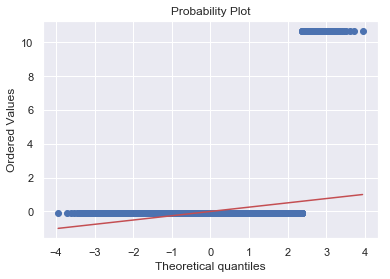

zip_98109


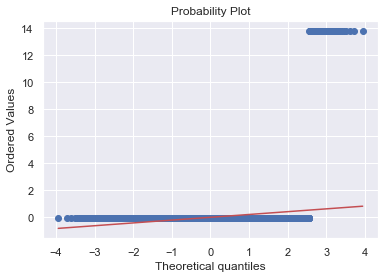

zip_98112


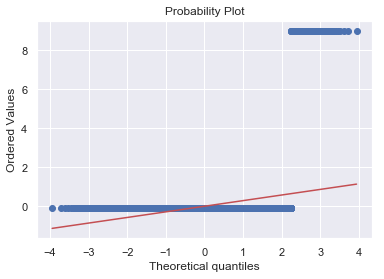

zip_98115


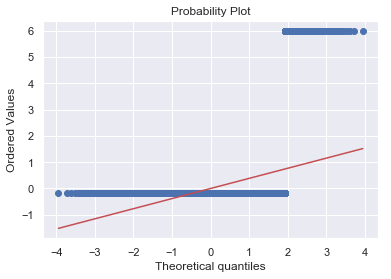

zip_98116


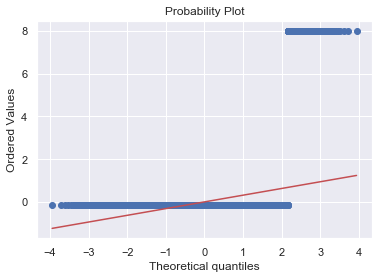

zip_98117


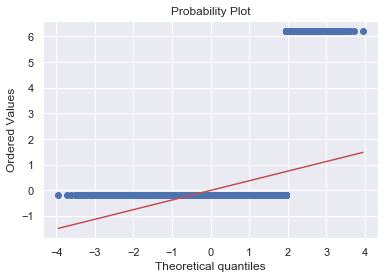

zip_98118


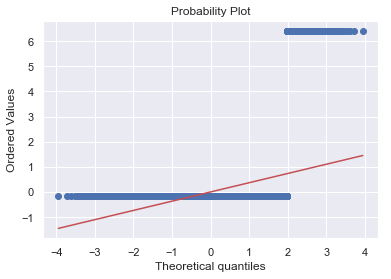

zip_98119


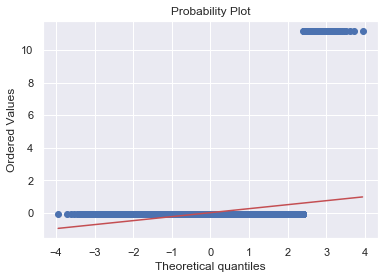

zip_98122


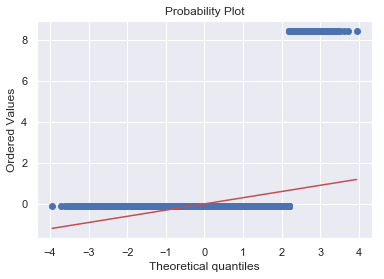

zip_98125


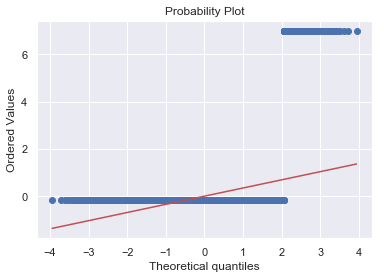

zip_98126


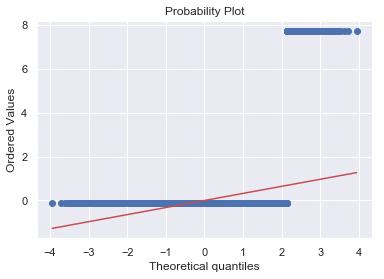

zip_98133


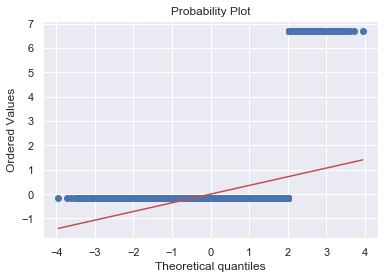

zip_98136


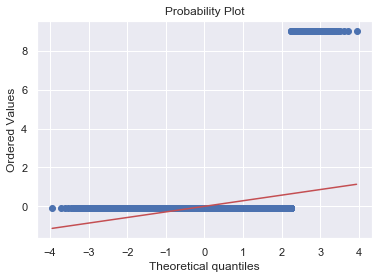

zip_98144


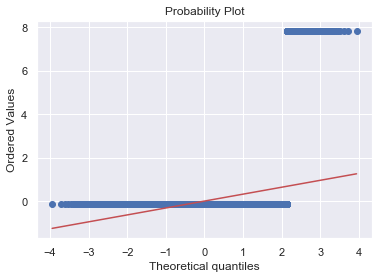

zip_98146


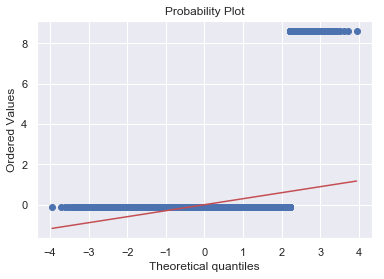

zip_98148


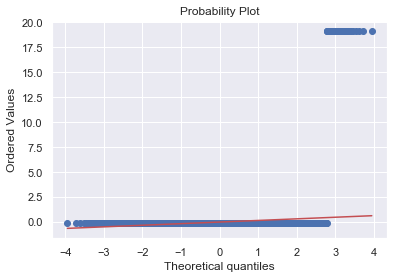

zip_98155


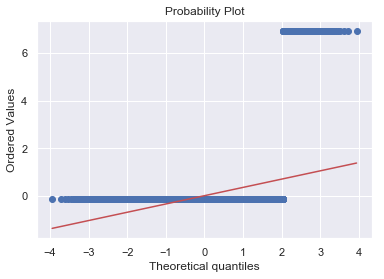

zip_98166


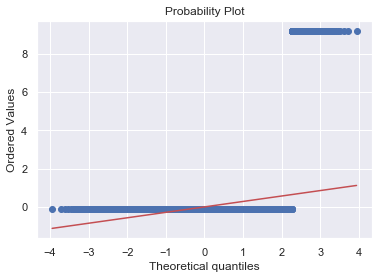

zip_98168


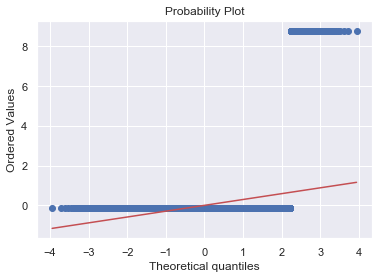

zip_98177


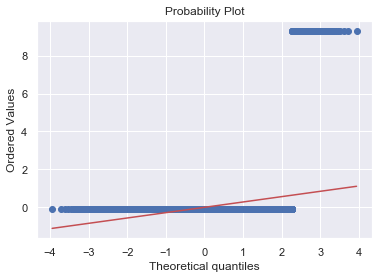

zip_98178


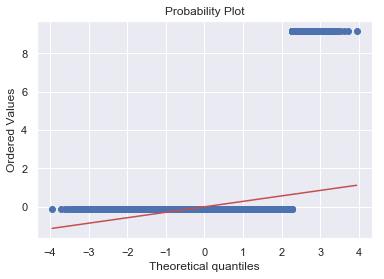

zip_98188


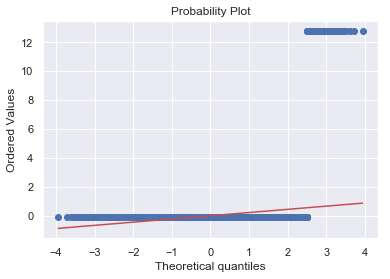

zip_98198


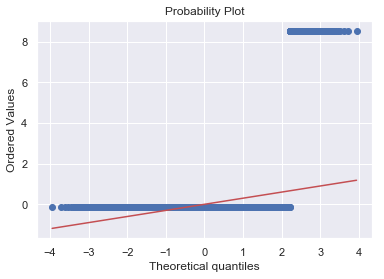

zip_98199


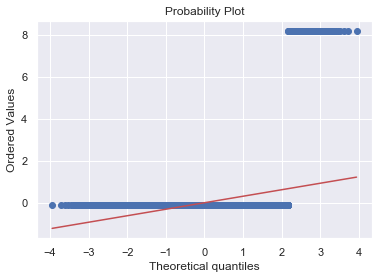

bathrooms_times_sqftliving15


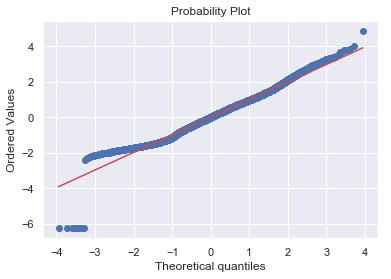

sqlv_grade_cond_interaction


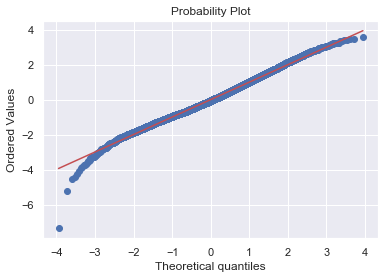

In [97]:
# Q-Q plots for X_train features
import pylab
for col in X_train.columns:
    measurements = X_train[col]
    print(col)
    stats.probplot(measurements, dist="norm", plot=pylab)
    pylab.show()

+ Use F-test to check for statistical significance of features

In [48]:
# F-test to select variables for model

from sklearn.feature_selection import SelectKBest, f_regression,mutual_info_regression

# Play with the k number
selector = SelectKBest(f_regression, k=50)

selector.fit(X_train, y_train)

SelectKBest(k=50, score_func=<function f_regression at 0x7ffbf8719e18>)

In [50]:
#DO NOT uncomment and run this cell's commented lines yet

selected_columns = X_train.columns[selector.get_support()]
removed_columns = X_train.columns[~selector.get_support()]
# X_train = X_train[selected_columns]
# X_test = X_test[selected_columns]

* Use wrapper methods

In [51]:
from sklearn.feature_selection import RFECV

In [52]:
ols = linear_model.LinearRegression()

In [54]:
# Create recursive feature eliminator that scores features by mean squared errors
selector = RFECV(estimator=ols, step=1, cv=5, scoring='neg_mean_squared_error')

# step size larger for more features

# Fit recursive feature eliminator 
selector.fit(X_train, y_train)

RFECV(cv=5,
   estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False),
   min_features_to_select=1, n_jobs=None, scoring='neg_mean_squared_error',
   step=1, verbose=0)

In [55]:
RFECV_selected_columns = X_train.columns[selector.support_]
RFECV_removed_columns = X_train.columns[~selector.support_]

In [56]:
list(RFECV_selected_columns)

['bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'lat',
 'long',
 'sqft_living15',
 'since_sold',
 'month_sold',
 'sqft_living_per_floor_log',
 'prox_to_downtown',
 'west_from_downtown',
 'zip_98002',
 'zip_98003',
 'zip_98004',
 'zip_98005',
 'zip_98006',
 'zip_98007',
 'zip_98008',
 'zip_98010',
 'zip_98011',
 'zip_98014',
 'zip_98019',
 'zip_98022',
 'zip_98023',
 'zip_98024',
 'zip_98027',
 'zip_98028',
 'zip_98029',
 'zip_98030',
 'zip_98031',
 'zip_98032',
 'zip_98033',
 'zip_98034',
 'zip_98038',
 'zip_98039',
 'zip_98040',
 'zip_98042',
 'zip_98045',
 'zip_98052',
 'zip_98053',
 'zip_98055',
 'zip_98056',
 'zip_98058',
 'zip_98059',
 'zip_98065',
 'zip_98070',
 'zip_98072',
 'zip_98074',
 'zip_98075',
 'zip_98077',
 'zip_98102',
 'zip_98103',
 'zip_98105',
 'zip_98107',
 'zip_98108',
 'zip_98109',
 'zip_98112',
 'zip_98115',
 'zip_98116',
 'zip_98117

In [57]:
list(RFECV_removed_columns)

['id', 'sqft_lot15', 'zip_98092', 'zip_98106', 'zip_98146', 'zip_98148']

+ Embedded feature selection with linear regression

In [59]:
X_train.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,since_sold,month_sold,sqft_living_per_floor_log,prox_to_downtown,west_from_downtown,zip_98002,zip_98003,zip_98004,zip_98005,zip_98006,zip_98007,zip_98008,zip_98010,zip_98011,zip_98014,zip_98019,zip_98022,zip_98023,zip_98024,zip_98027,zip_98028,zip_98029,zip_98030,zip_98031,zip_98032,zip_98033,zip_98034,zip_98038,zip_98039,zip_98040,zip_98042,zip_98045,zip_98052,zip_98053,zip_98055,zip_98056,zip_98058,zip_98059,zip_98065,zip_98070,zip_98072,zip_98074,zip_98075,zip_98077,zip_98092,zip_98102,zip_98103,zip_98105,zip_98106,zip_98107,zip_98108,zip_98109,zip_98112,zip_98115,zip_98116,zip_98117,zip_98118,zip_98119,zip_98122,zip_98125,zip_98126,zip_98133,zip_98136,zip_98144,zip_98146,zip_98148,zip_98155,zip_98166,zip_98168,zip_98177,zip_98178,zip_98188,zip_98198,zip_98199,bathrooms_times_sqftliving15,sqlv_grade_cond_interaction
0,0.642119,-0.403542,0.506207,0.094598,-0.116962,-0.910967,-0.087401,-0.304417,-0.633256,-0.560249,-0.517089,1.160748,0.234953,-0.210614,1.228256,-0.832505,0.038034,-0.178546,-1.447833,-0.826542,1.086097,-0.556170,0.045518,-0.097282,-0.116401,-0.120668,-0.086726,-0.152949,-0.078935,-0.114859,-0.06777,-0.096368,-0.075522,-0.095755,-0.104595,-0.15374,-0.062855,-0.141459,-0.115117,-0.125275,-0.110111,-0.112509,-0.077436,-0.142731,-0.160698,-0.166845,-0.048168,-0.114081,-0.160128,-0.102309,-0.161076,-0.137361,-0.112772,-0.139531,-0.150152,-0.149142,-0.118427,-0.073161,-0.11198,-0.14441,-0.129266,-0.097584,-0.129728,-0.069892,-0.169393,-0.103172,-0.125751,-0.109571,-0.093577,-0.072357,-0.110916,-0.166662,-0.124798,-0.160698,-0.155896,-0.089396,-0.118427,-0.142731,-0.129266,6.705031,-0.110648,-0.127403,-0.115889,-0.052224,-0.144201,-0.108757,-0.11382,-0.107387,-0.109029,-0.078189,-0.117165,-0.122141,0.419834,-0.266711
1,-1.444174,-1.506721,-1.449362,-1.515471,-0.236225,-0.910967,-0.087401,-0.304417,0.901050,-2.271146,-1.321889,-0.660624,-0.617149,-0.210614,-0.456893,0.325123,-1.486741,-0.252125,-1.447833,-0.826542,-1.538086,-0.064541,0.045518,-0.097282,-0.116401,-0.120668,-0.086726,-0.152949,-0.078935,-0.114859,-0.06777,-0.096368,-0.075522,-0.095755,-0.104595,-0.15374,-0.062855,-0.141459,-0.115117,-0.125275,-0.110111,-0.112509,-0.077436,-0.142731,-0.160698,-0.166845,-0.048168,-0.114081,-0.160128,-0.102309,-0.161076,-0.137361,-0.112772,7.166843,-0.150152,-0.149142,-0.118427,-0.073161,-0.11198,-0.14441,-0.129266,-0.097584,-0.129728,-0.069892,-0.169393,-0.103172,-0.125751,-0.109571,-0.093577,-0.072357,-0.110916,-0.166662,-0.124798,-0.160698,-0.155896,-0.089396,-0.118427,-0.142731,-0.129266,-0.149142,-0.110648,-0.127403,-0.115889,-0.052224,-0.144201,-0.108757,-0.11382,-0.107387,-0.109029,-0.078189,-0.117165,-0.122141,-1.836316,-1.956995
2,-0.171396,0.699638,0.506207,0.006375,-0.094139,-0.910967,-0.087401,-0.304417,2.435356,0.295199,0.360875,-0.660624,-0.583064,-0.210614,1.092752,-0.534221,-0.870966,-0.175731,-1.447833,-1.468762,0.998203,-0.676473,0.045518,-0.097282,-0.116401,-0.120668,-0.086726,-0.152949,-0.078935,-0.114859,-0.06777,-0.096368,-0.075522,-0.095755,-0.104595,-0.15374,-0.062855,-0.141459,-0.115117,-0.125275,-0.110111,-0.112509,-0.077436,-0.142731,-0.160698,-0.166845,-0.048168,-0.114081,-0.160128,-0.102309,-0.161076,-0.137361,-0.112772,-0.139531,-0.150152,-0.149142,-0.118427,-0.073161,-0.11198,-0.14441,-0.129266,-0.097584,-0.129728,-0.069892,-0.169393,-0.103172,-0.125751,-0.109571,-0.093577,-0.072357,-0.110916,-0.166662,-0.124798,-0.160698,-0.155896,-0.089396,-0.118427,7.006208,-0.129266,-0.149142,-0.110648,-0.127403,-0.115889,-0.052224,-0.144201,-0.108757,-0.11382,-0.107387,-0.109029,-0.078189,-0.117165,-0.122141,-0.169594,0.332371
3,-1.437213,-1.506721,-1.449362,-1.294913,-0.226590,-0.910967,-0.087401,-0.304417,-0.633256,-0.560249,-1.078010,-0.660624,-0.821653,-0.210614,0.926976,-0.534221,-1.046902,-0.262914,0.690688,1.742338,-0.952796,-0.877562,0

In [60]:
lm = linear_model.LinearRegression()
lm.fit(X_train, y_train)
y_train_pred = lm.predict(X_train)
y_test_pred = lm.predict(X_test)

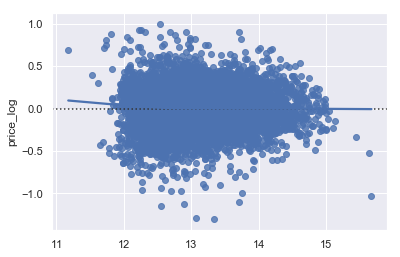

In [61]:
sns.residplot(y_train_pred, y_train, lowess=True, color="b")

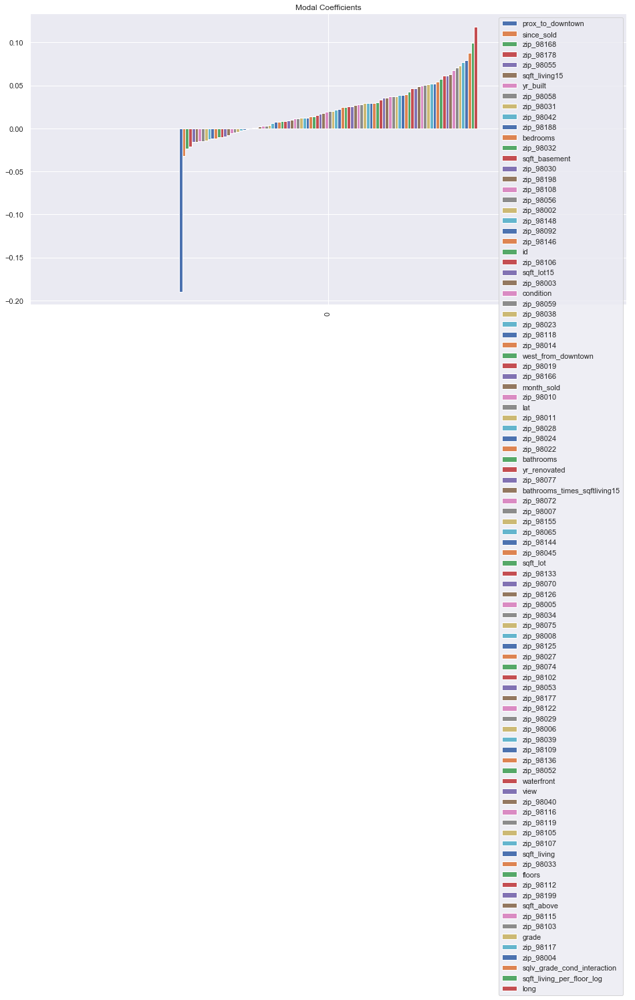

In [74]:
coef = pd.DataFrame(data=lm.coef_ ).T
coef.columns = X_train.columns

model_coef = coef.T.sort_values(by=0).T
model_coef.plot(kind='bar', title='Modal Coefficients', legend=True, figsize=(16,8),)

In [69]:
model_coef.T

,0
prox_to_downtown,-0.189555
since_sold,-0.031801
zip_98168,-0.023653
zip_98178,-0.021122
zip_98055,-0.015955
sqft_living15,-0.015944
yr_built,-0.014693
zip_98058,-0.014628
zip_98031,-0.014205
zip_98042,-0.012463


In [75]:
## training the model
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.01, normalize=False)

lasso.fit(X_train,y_train)

y_train_pred = lasso.predict(X_train)
y_pred = lasso.predict(X_test)

train_rmse = metrics.mean_absolute_error(y_train, y_train_pred)
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Training RMS Error: '+ str(train_rmse) )
print('Testing RMS Error: '+ str(test_rmse) )

Training RMS Error: 0.14926805082387828
Testing RMS Error: 0.19522702884598908


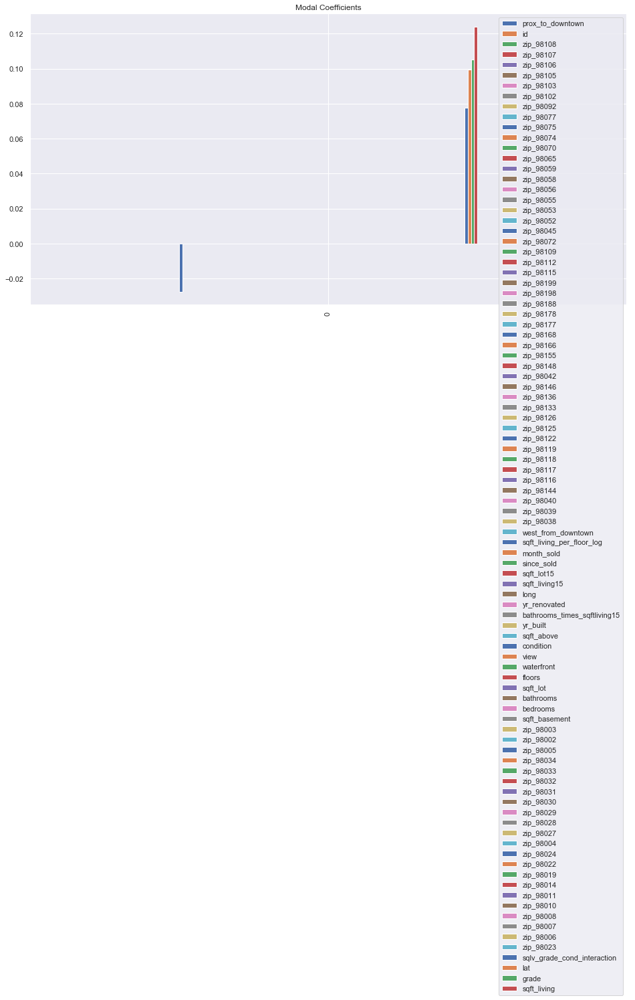

In [73]:
# Use lasso to minimize some coefficients
lasso_coef01 = pd.DataFrame(data=lasso.coef_).T
lasso_coef01.columns = X_train.columns
lasso_coef01 = lasso_coef01.T.sort_values(by=0).T
lasso_coef01.plot(kind='bar', title='Modal Coefficients', legend=True, figsize=(16,8))

In [67]:
lasso_coef01.T

,0
prox_to_downtown,-0.100732
zip_98168,-0.025684
zip_98155,-0.024753
zip_98133,-0.021306
zip_98178,-0.020162
zip_98028,-0.019874
yr_built,-0.013372
zip_98055,-0.012583
zip_98011,-0.012206
since_sold,-0.011890


Training RMS Error: 0.23966260066656644
Testing RMS Error: 0.2998706789290423


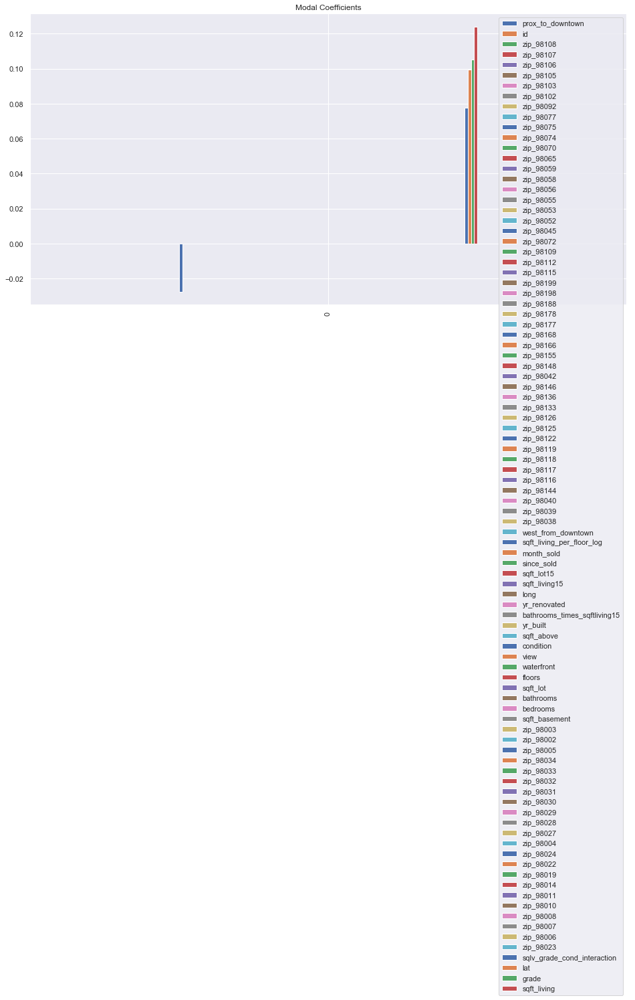

In [76]:
# See if lasso improved the model
# It actually made the model quite a bit less accurate on both training and testing
## training the model

from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.1, normalize=False)

lasso.fit(X_train,y_train)

y_train_pred = lasso.predict(X_train)
y_pred = lasso.predict(X_test)

train_rmse = metrics.mean_absolute_error(y_train, y_train_pred)
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Training RMS Error: '+ str(train_rmse) )
print('Testing RMS Error: '+ str(test_rmse) )

lasso_coef01 = pd.DataFrame(data=lasso.coef_).T
lasso_coef01.columns = X_train.columns
lasso_coef01 = lasso_coef01.T.sort_values(by=0).T
lasso_coef01.plot(kind='bar', title='Modal Coefficients', legend=True, figsize=(16,8))

+ Ridge model

In [77]:
from sklearn.linear_model import Ridge

## training the model

ridgeReg = Ridge(alpha=0.1, normalize=True)

ridgeReg.fit(X_train, y_train)

y_pred_ridge = ridgeReg.predict(X_test)

#calculating rmse
RMSE_R01 = np.sqrt(metrics.mean_squared_error(y_test, y_pred_ridge))
print('Test RMSE:', RMSE_R01)

Test RMSE: 0.1774676651046001


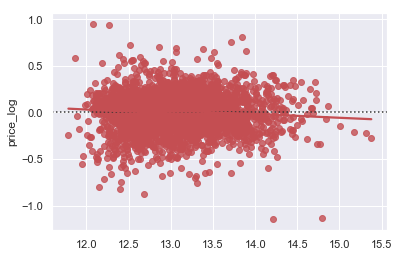

In [80]:
# Plot the residuals
sns.residplot(y_pred_ridge, y_test, lowess=True, color="r")

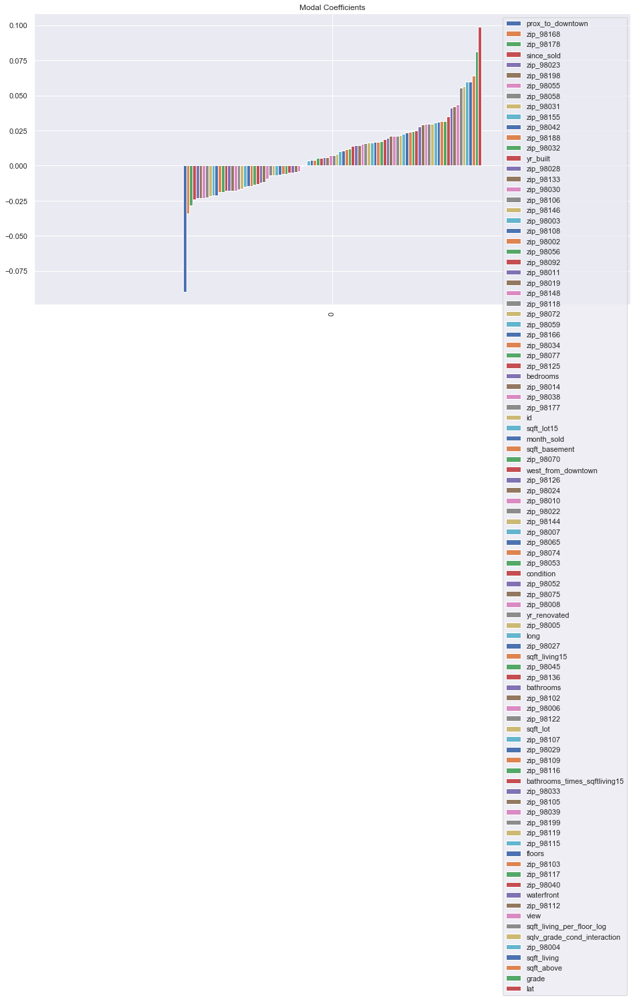

In [83]:
# print(np.sqrt(metrics.mean_squared_error(y_test, y_pred))/ y_test.outcome.std())
ridge_coef_01 = pd.DataFrame(data=ridgeReg.coef_).T
ridge_coef_01.columns = X_test.columns
ridge_coef_01 = ridge_coef_01.T.sort_values(by=0).T
ridge_coef_01.plot(kind='bar', title='Modal Coefficients', legend=True, figsize=(16,8))

In [89]:
ridge_coef_01.T

,0
prox_to_downtown,-0.089745
zip_98168,-0.034351
zip_98178,-0.028402
since_sold,-0.023929
zip_98023,-0.023334
zip_98198,-0.023088
zip_98055,-0.023030
zip_98058,-0.022587
zip_98031,-0.021693
zip_98155,-0.021515
